<a href="https://colab.research.google.com/github/arahogc/Whats_In_A_Bottle/blob/Jess/word_cloud.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Word Cloud Analysis

Generating word clouds from the description column based on points and price.

### Import Dependencies and Start Spark Session

In [1]:
# Initialize Spark
import os

# Find the latest version of spark 2.0  from http://www-us.apache.org/dist/spark/ and enter as the spark version
spark_version = 'spark-3.0.2'
os.environ['SPARK_VERSION']=spark_version

# Install Spark and Java
!apt-get update
!apt-get install openjdk-11-jdk-headless -qq > /dev/null
!wget -q http://www-us.apache.org/dist/spark/$SPARK_VERSION/$SPARK_VERSION-bin-hadoop2.7.tgz
!tar xf $SPARK_VERSION-bin-hadoop2.7.tgz
!pip install -q findspark

# Set Environment Variables
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-11-openjdk-amd64"
os.environ["SPARK_HOME"] = f"/content/{spark_version}-bin-hadoop2.7"

# Start a SparkSession
import findspark
findspark.init()

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Get:3 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Ign:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:5 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Hit:6 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [697 B]
Hit:8 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:9 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release.gpg [836 B]
Get:10 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:11 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ Packages [53.1 kB]
Hit:12 http://ppa.launchpad.net/cran/

In [2]:
# Install additional packages
# Spark NLP 
! pip install --ignore-installed spark-nlp==2.4.5
# Amazon boto3
! pip install boto3
# Pyspark
! pip install pyspark

     |████████████████████████████████| 112kB 5.2MB/s 
     |████████████████████████████████| 133kB 5.3MB/s 
     |████████████████████████████████| 81kB 6.2MB/s 
     |████████████████████████████████| 7.4MB 15.5MB/s 
     |████████████████████████████████| 153kB 39.9MB/s 
ERROR: requests 2.23.0 has requirement urllib3!=1.25.0,!=1.25.1,<1.26,>=1.21.1, but you'll have urllib3 1.26.4 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
  Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
     |████████████████████████████████| 212.3MB 70kB/s 
     |████████████████████████████████| 204kB 16.3MB/s 
  Created wheel for pyspark: filename=pyspark-3.1.1-py2.py3-none-any.whl size=212767604 sha256=30d903bbecd7db799ba2a2cdde7c739e1aab6382b3641f32117bb1b684607441
  Stored in directory: /root/.cache/pip/wheels/0b/90/c0/01de724414ef122bd05f056541fb

In [3]:
# Import spark nlp
import sparknlp
spark = sparknlp.start()

In [4]:
# Import dependencies
import pandas as pd 
import numpy as np

from pyspark import SparkFiles, SparkContext, SparkConf
from pyspark.sql import SparkSession

from pyspark.ml.feature import Tokenizer
from pyspark.sql.functions import col, udf
from pyspark.sql.types import IntegerType

from pyspark.ml.feature import VectorAssembler
from pyspark.ml.linalg import Vector

# Import the stop words library
from pyspark.ml.feature import HashingTF, IDF, Tokenizer, StopWordsRemover, Normalizer, StringIndexer

# Import sklearn and tensorflow dependencies
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,OneHotEncoder
import tensorflow as tf

/usr/local/lib/python3.7/dist-packages/requests/__init__.py:91: RequestsDependencyWarning: urllib3 (1.26.4) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


In [5]:
os.environ['PYSPARK_SUBMIT_ARGS'] = '-- packages com.amazonaws:aws-java-sdk:1.7.4,org.apache.hadoop:hadoop-aws:2.7.3 pyspark-shell'

In [6]:
# Start Spark session with connection to postgres
spark = SparkSession.builder.appName("Whats_In_A_Bottle").config("spark.driver.extraClassPath","/content/postgresql-42.2.16.jar").getOrCreate()

### Import Data from S3

In [10]:
# Load the binned dataframe from s3
# Read in data from S3 Buckets
url ="https://whats-in-a-bottle.s3-us-west-1.amazonaws.com/winemag-data_cleaned_ReadyToEncode.csv"
spark.sparkContext.addFile(url)
spark_df = spark.read.csv(SparkFiles.get("winemag-data_cleaned_ReadyToEncode.csv"), sep=",", header=True)
spark_df.show(truncate=False)

+---+-------+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+-----------+------+-----+------------------+-----------------+------------------+------+------+---------------+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [29]:
df = spark_df.toPandas()
df.dtypes

_c0                object
country            object
description        object
designation        object
points             object
price              object
province           object
region_1           object
variety            object
winery             object
tokens             object
filtered_tokens    object
features           object
dtype: object

In [30]:
df['_c0'] = df['_c0'].astype('int')
df[['points','price']]

df[['points','price','tokens','filtered_tokens']] = df[['points','price','tokens','filtered_tokens']].apply(pd.to_numeric, errors = 'coerce')
df.dtypes

_c0                  int64
country             object
description         object
designation         object
points             float64
price              float64
province            object
region_1            object
variety             object
winery              object
tokens             float64
filtered_tokens    float64
features            object
dtype: object

### Create a WordCloud

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

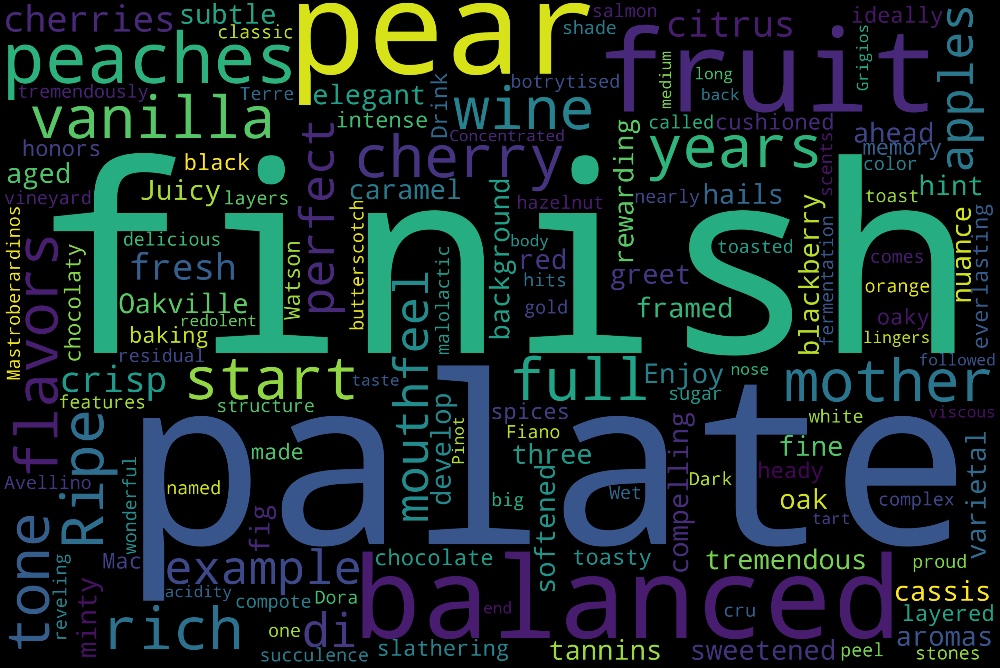

In [31]:
# Create a word cloud from the description column
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from google.colab import files

text = df.description.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

plt.savefig("WordCloud_total.png")
files.download("WordCloud_total.png") 

plt.show()

### Split the dataframe based on points and price ranking
Then perform word cloud analysis on each dataframe to see how word frequency changes based on points/price ranking.

In [32]:
# Create empty columns for rankings
df.insert(4, "points_ranked", '')
df.insert(6, "price_ranked", '')
df.head()

,_c0,country,description,designation,points_ranked,points,price_ranked,price,province,region_1,variety,winery,tokens,filtered_tokens,features
0,0,US,This tremendous 100% varietal wine hails from ...,Other,,96.0,,235.0,California,Napa Valley,Cabernet Sauvignon,Other,60.0,36.0,"(262144,[2701,16004,23236,28401,33079,39068,45..."
1,1,Spain,"Ripe aromas of fig, blackberry and cassis are ...",Other,,96.0,,110.0,Northern Spain,Other,Other,Other,51.0,31.0,"(262144,[11481,33140,41643,46758,55709,59455,6..."
2,2,US,Mac Watson honors the memory of a wine once ma...,Other,,96.0,,90.0,California,Other,Sauvignon Blanc,Other,47.0,30.0,"(262144,[10077,26468,32151,49402,61157,64289,7..."
3,3,US,"This spent 20 months in 30% new French oak, an...",Reserve,,96.0,,65.0,Oregon,Willamette Valley,Pinot Noir,Other,62.0,43.0,"(262144,[1546,4238,13171,15324,16356,25381,331..."
4,4,France,"This is the top wine from La Bégude, named aft...",Other,,95.0,,66.0,Provence,Other,Other,Other,66.0,37.0,"(262144,[1546,17161,18176,31536,33140,48479,49..."


In [33]:
# Change the price and points columns to categorical values for bucketing

# excellent = 1 = 100-90
# good = 2 = 89.9 - 88
# average = 3 = 87.9 - 86
# ok = 4 = 85.9 - 80

df.loc[(df['points'] >= 90),'points_ranked'] = 'Excellent'
df.loc[(df['points'] <= 89.9) & (df['points'] >= 88),'points_ranked'] = 'Good'
df.loc[(df['points'] <= 87.9) & (df['points'] >= 86),'points_ranked'] = 'Average'
df.loc[(df['points'] < 85.9),'points_ranked'] = 'ok'
points_ranked_count = df['points_ranked'].value_counts()


# top_shelf = 1 = 2300 - 40
# high = 2 = 39.9 - 24
# med = 3 = 23.9 - 16
# low = 4 = 15.9 - 4

df.loc[(df['price'] >= 40),'price_ranked'] = 'Top Shelf'
df.loc[(df['price'] <= 39.9) & (df['price'] >= 24),'price_ranked'] = 'High'
df.loc[(df['price'] <= 23.9) & (df['price'] >= 16),'price_ranked'] = 'Med'
df.loc[(df['price'] < 15.9),'price_ranked'] = 'Low'
price_ranked_count = df['price_ranked'].value_counts()

print(points_ranked_count)
print(price_ranked_count)

Excellent    42438
ok           33802
Average      33371
Good         27583
                27
Name: points_ranked, dtype: int64
High         36113
Top Shelf    35323
Low          33883
Med          31877
                25
Name: price_ranked, dtype: int64


In [49]:
# Split the dataframes into points and price categories

excellent_df = df[df['points_ranked'] == 'Excellent']
good_df = df[df['points_ranked'] == 'Good']
avg_df = df[df['points_ranked'] == 'Average']
ok_df = df[df['points_ranked'] == 'ok']

topshelf_df = df[df['price_ranked'] == 'Top Shelf']
high_df = df[df['price_ranked'] == 'High']
medium_df = df[df['price_ranked'] == 'Med']
low_df = df[df['price_ranked'] == 'Low']

In [50]:
# check the dataframe
medium_df.head()

,_c0,country,description,designation,points_ranked,points,price_ranked,price,province,region_1,variety,winery,tokens,filtered_tokens,features
32,33,France,"Pale in color, this is nutty in character, wit...",Other,Excellent,90.0,Med,22.0,Other,Other,Sparkling Blend,Other,37.0,19.0,"(262144,[10564,16733,31536,34996,80028,91457,1..."
37,38,Italy,"This has a charming nose that boasts rose, vio...",N/A,Excellent,90.0,Med,23.0,Tuscany,Chianti Classico,Sangiovese,Other,47.0,29.0,"(262144,[7932,10564,28511,37019,47158,47464,49..."
39,40,Spain,Earthy plum and cherry aromas score points for...,Other,Excellent,90.0,Med,17.0,Galicia,Other,Other,Other,41.0,25.0,"(262144,[5765,28401,46758,71705,78495,79709,90..."
53,54,US,There's a lot to like in this nicely priced wh...,N/A,Excellent,90.0,Med,18.0,California,Russian River Valley,Chardonnay,De Loach,39.0,25.0,"(262144,[10044,16242,32680,65352,76490,77682,8..."
62,64,Portugal,"This is a super-ripe, still very young wine. I...",N/A,Excellent,91.0,Med,23.0,Alentejano,N/A,Portuguese Red,Other,48.0,27.0,"(262144,[31536,36225,46754,77620,86617,102935,..."


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

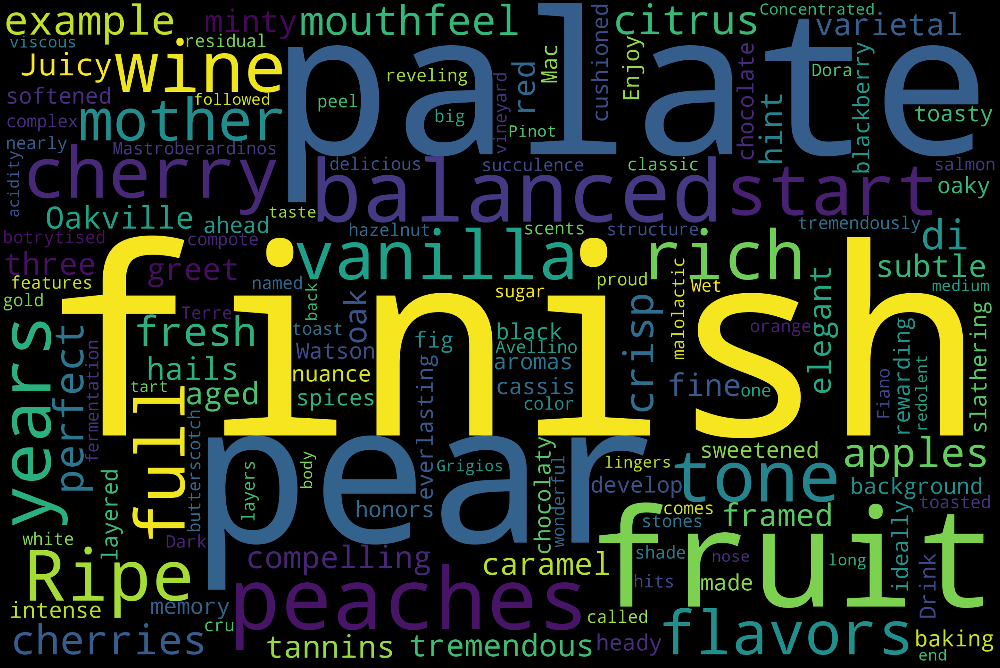

In [37]:
# Excellent DF
# Create a word cloud from the description column
text = excellent_df.description.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

plt.savefig("WordCloud_points_excellent.png")
files.download("WordCloud_points_excellent.png") 

plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

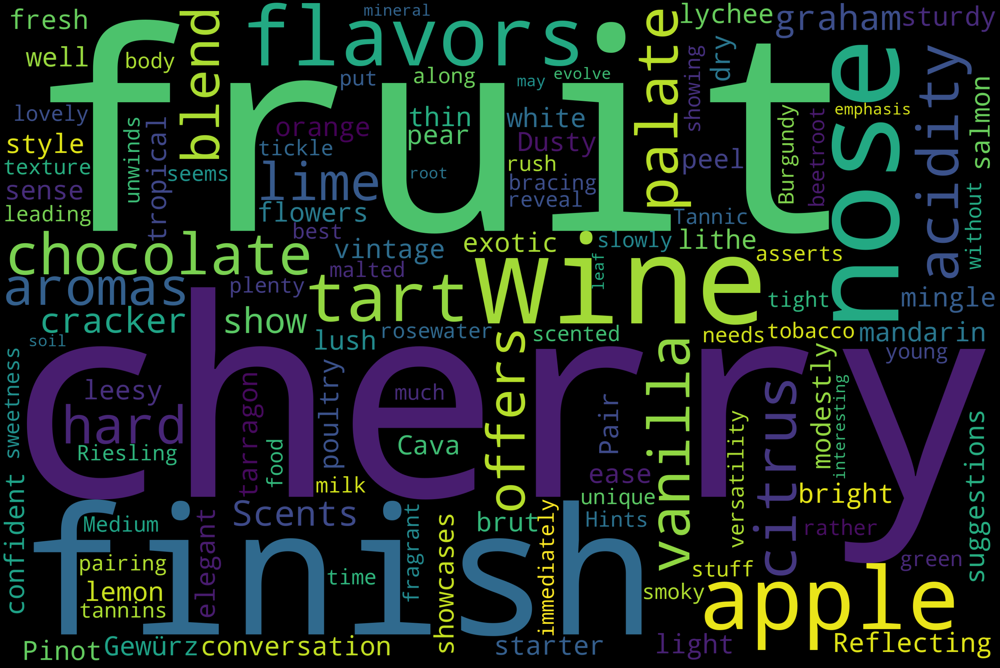

In [42]:
# Good DF
# Create a word cloud from the description column
text = good_df.description.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

plt.savefig("WordCloud_points_good.png")
files.download("WordCloud_points_good.png") 

plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

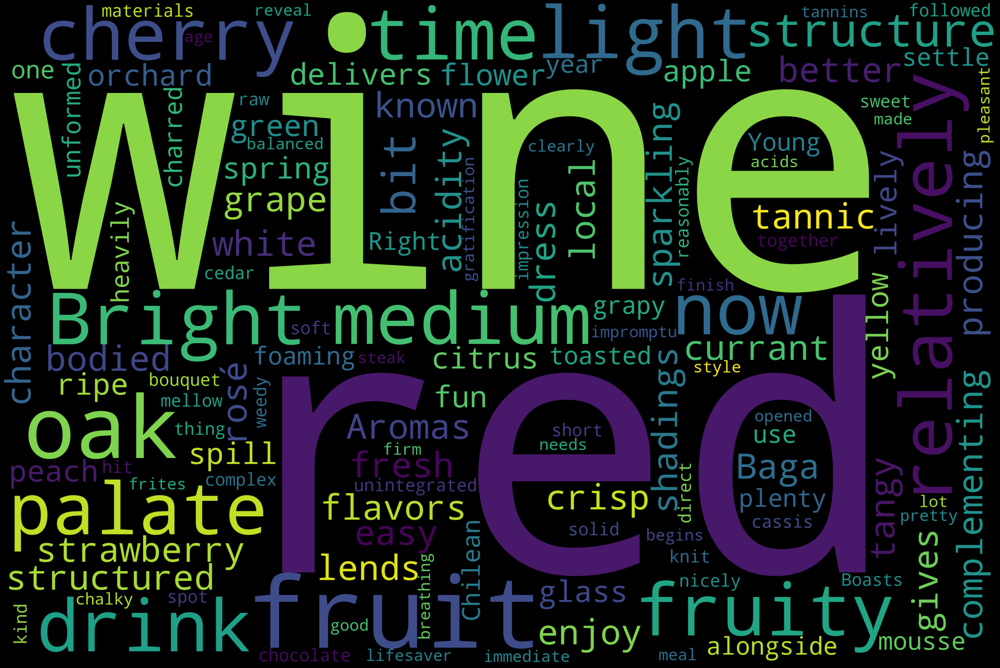

In [40]:
# Average DF
# Create a word cloud from the description column
text = avg_df.description.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

plt.savefig("WordCloud_points_average.png")
files.download("WordCloud_points_average.png") 

plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

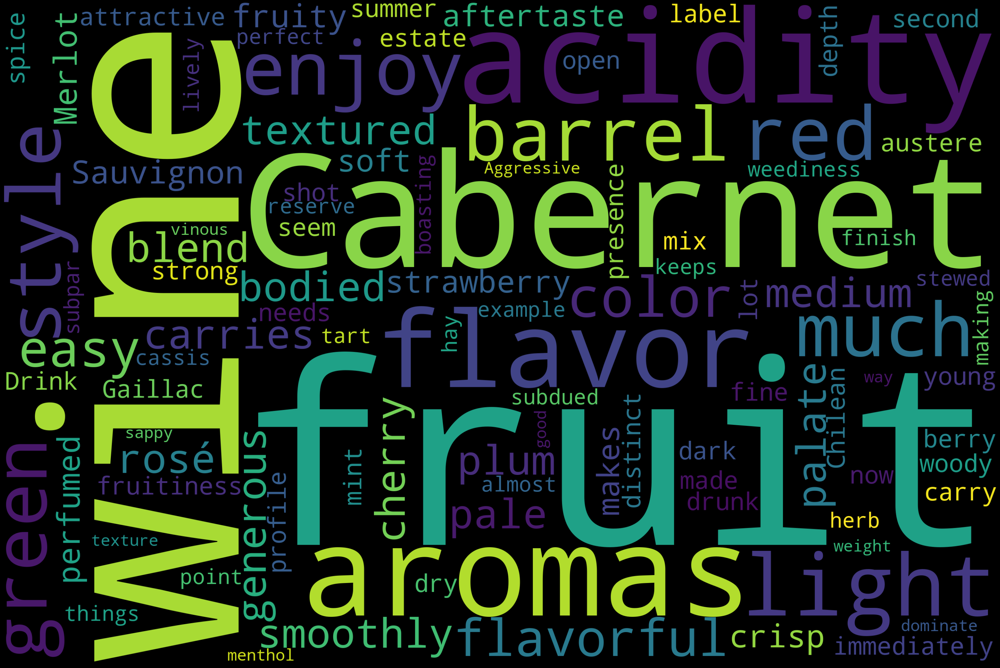

In [43]:
# ok DF
# Create a word cloud from the description column
text = ok_df.description.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

plt.savefig("WordCloud_points_ok.png")
files.download("WordCloud_points_ok.png") 

plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

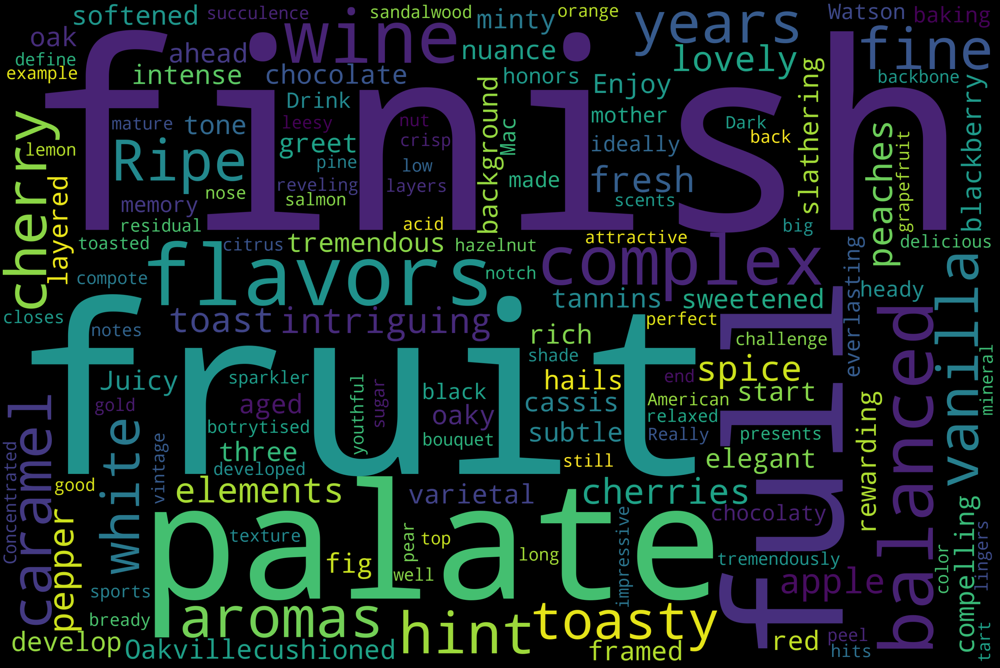

In [44]:
# topshelf DF
# Create a word cloud from the description column
text = topshelf_df.description.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

plt.savefig("WordCloud_price_topshelf.png")
files.download("WordCloud_price_topshelf.png") 

plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

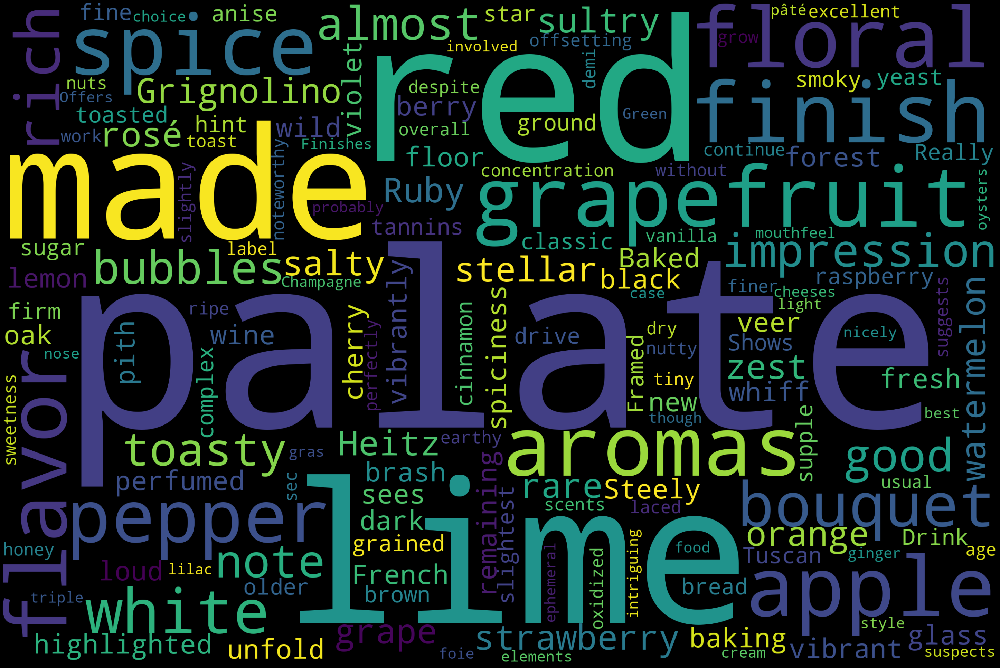

In [46]:
# high DF
# Create a word cloud from the description column
text = high_df.description.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

plt.savefig("WordCloud_price_high.png")
files.download("WordCloud_price_high.png") 

plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

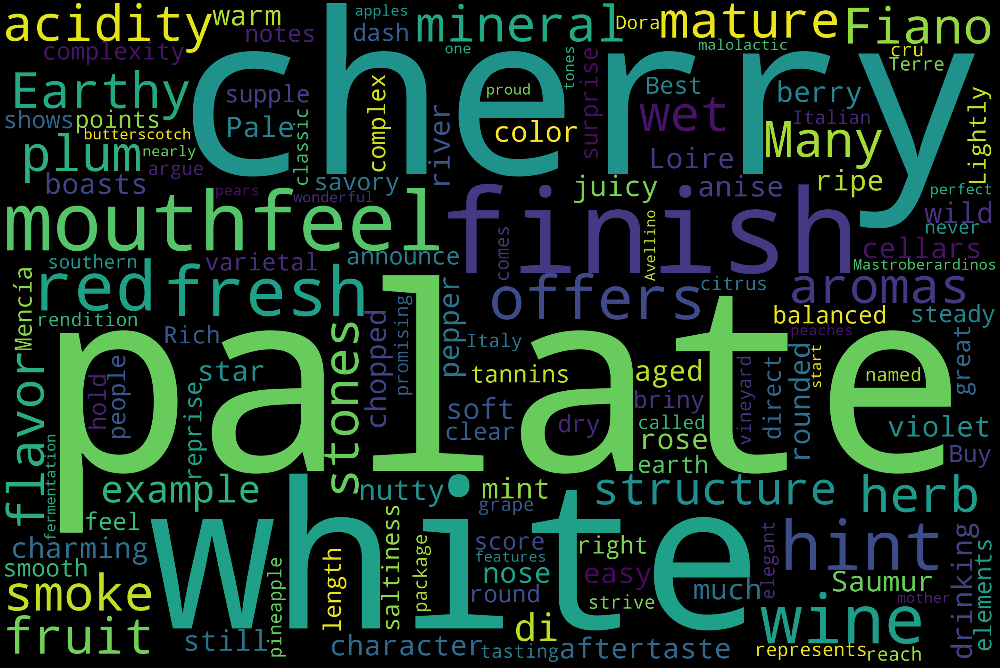

In [51]:
# medium DF
# Create a word cloud from the description column
text = medium_df.description.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

plt.savefig("WordCloud_price_medium.png")
files.download("WordCloud_price_medium.png") 

plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

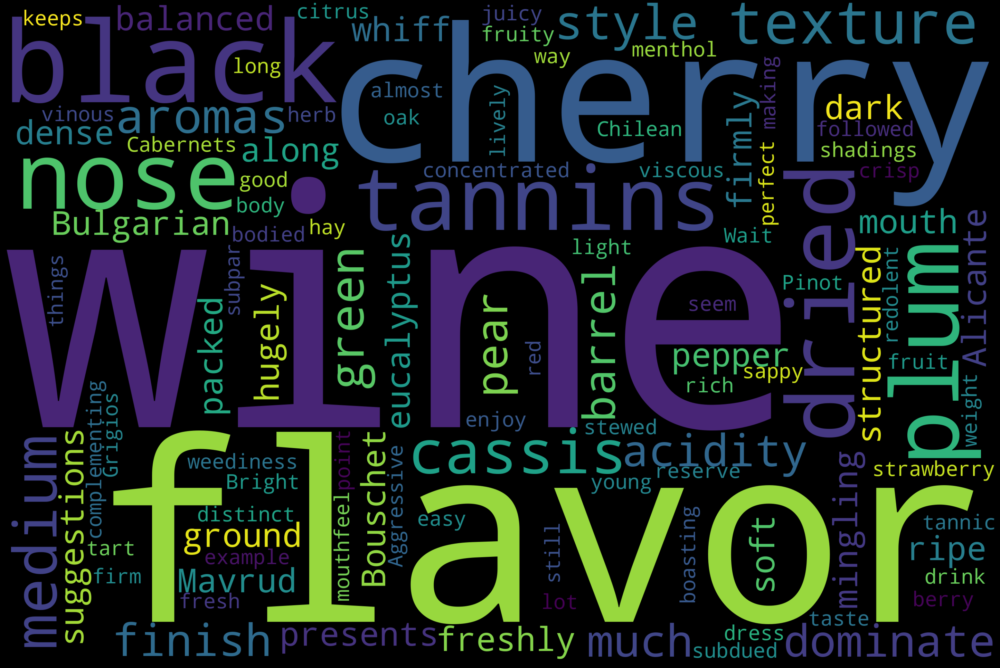

In [52]:
# low DF
# Create a word cloud from the description column
text = low_df.description.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

plt.savefig("WordCloud_price_low.png")
files.download("WordCloud_price_low.png") 

plt.show()